In [56]:
import numpy as np

rng = np.random.default_rng(seed = 1234)
cl1 = rng.multivariate_normal([-2,-2], [[1,-0.5],[-0.5,1]], size
=100)
cl2 = rng.multivariate_normal([1,0], [[1,0],[0,1]], size=150)
cl3 = rng.multivariate_normal([3,2], [[1,-0.7],[-0.7,1]], size
=200)
pts = np.concatenate((cl1,cl2,cl3))

In [57]:
len(pts)

450

In [58]:
import random
import matplotlib.pyplot as plt
import time

In [59]:
pts[0]

array([-0.57898663, -3.35691346])

In [60]:
centroids = [pts[int(len(pts) * random.random())] for _ in range(3)]
NpArray = [[]]* (len(pts))
for i in range(len(pts)):
    for x in range(len(centroids)):
        NpArray[i].append(np.linalg.norm(pts[i]-centroids[x]))
NpArray

[[5.173236747243696,
  6.623353970985135,
  6.384061939403311,
  5.533964853490762,
  6.0543387440326795,
  6.873648619190123,
  3.916003693944982,
  4.1203934545461145,
  5.217638964228249,
  4.536274594927012,
  5.990203032620391,
  5.758662221912134,
  4.987709716030824,
  6.47212359367789,
  6.188926688300798,
  4.296130535111849,
  5.3594973280804,
  5.614290473469809,
  4.816891868915882,
  6.017146534725183,
  6.105283233040738,
  6.708230978476364,
  7.974713644691308,
  7.957787308204303,
  4.360968702280356,
  4.928974659411985,
  5.699355163507332,
  6.200265947225004,
  6.862963198800586,
  7.539536923314144,
  4.916667590044035,
  5.6180445718615255,
  6.256863172437047,
  6.6051137770888335,
  7.025924219209407,
  7.943575228018823,
  5.383306456222018,
  5.911349121723293,
  6.722941113749857,
  5.322304381385188,
  6.1775788352902525,
  6.654111952738869,
  5.636563488861268,
  6.7456461697479035,
  6.933472852320878,
  5.796638976642539,
  6.060256375008266,
  7.122968

In [61]:
NpArray = [[0,0,0]]* (len(pts))
NpArray
NpArray[1][0]

0

In [62]:
centroids = [pts[int(len(pts) * random.random())] for _ in range(3)]
centroids

[array([3.17218943, 1.6268997 ]),
 array([ 2.37822335, -1.33487969]),
 array([ 1.67520488, -1.53954711])]

In [63]:
def kmeans(pts,k=3,max_iter=1000):
    centroids = [pts[int(len(pts) * random.random())] for _ in range(k)]
    last_centroids = []
    for _ in range(max_iter):
        clusters = {}
        for i in range(k):
            clusters[i] = []
        for pt in pts:
            dist = []
            for centroid in centroids:
                dist.append(np.linalg.norm(pt-centroid))
            clusters[dist.index(min(dist))].append(pt)
        for i in range(k):
            centroids[i] = np.average(clusters[i], axis=0)
        if np.array_equal(centroids,last_centroids):
            break
        else:
           last_centroids = np.copy(centroids)
    return centroids, clusters

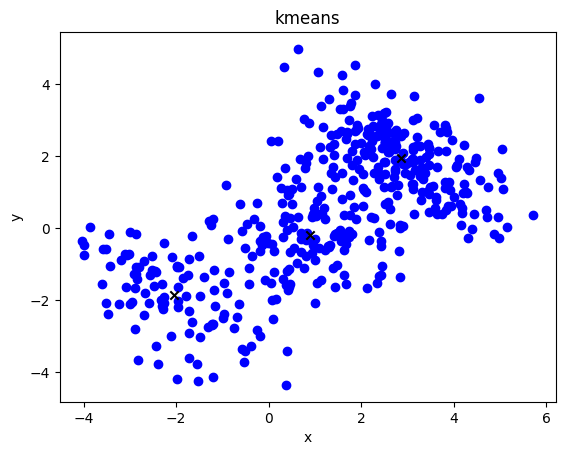

In [64]:
centroids, clusters = kmeans(pts,k=3)
indices = []
for key, value in clusters.items():
    indices.extend([key] * len(value))

x = pts[:,0]
y = pts[:,1]
plt.title("kmeans") 
plt.xlabel("x") 
plt.ylabel("y")
for i in range(len(centroids)):
    plt.scatter(np.array(clusters[i])[:,0],np.array(clusters[i])[:,1],color='blue')
plt.scatter( [i[0] for i in centroids], [i[1] for i in centroids],color='black', marker='x')
plt.show()

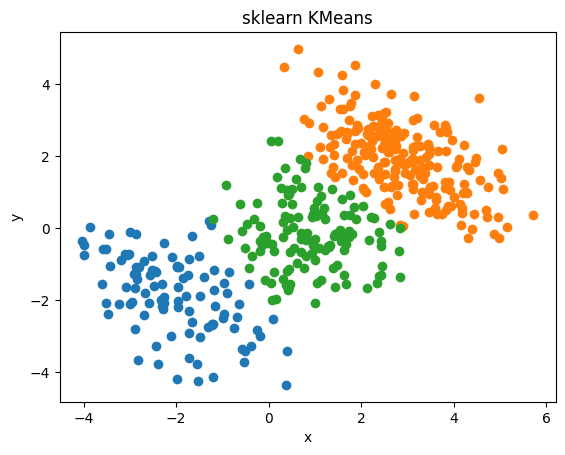

In [65]:
from sklearn.cluster import KMeans

skmeans = KMeans(n_clusters=3)
label = skmeans.fit_predict(pts)
u_labels = np.unique(label)
for i in u_labels:
    plt.scatter(pts[label == i , 0] , pts[label == i , 1] , label = i)

plt.title("sklearn KMeans")
plt.xlabel("x") 
plt.ylabel("y")
plt.show()

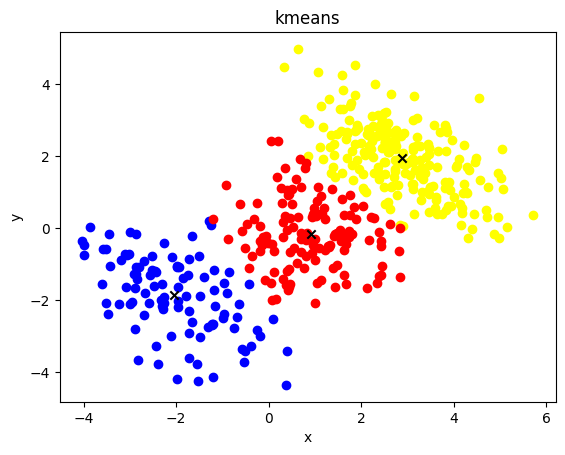

In [66]:
centroids, clusters = kmeans(pts,k=3,max_iter=1000)
indices = []
for key, value in clusters.items():
    indices.extend([key] * len(value))

x = pts[:,0]
y = pts[:,1]
plt.title("kmeans") 
plt.xlabel("x") 
plt.ylabel("y")
plt.scatter(np.array(clusters[0])[:,0],np.array(clusters[0])[:,1],color='blue')
plt.scatter(np.array(clusters[1])[:,0],np.array(clusters[1])[:,1],color='yellow')
plt.scatter(np.array(clusters[2])[:,0],np.array(clusters[2])[:,1],color='red')
plt.scatter( [i[0] for i in centroids], [i[1] for i in centroids],color='black', marker='x')
plt.show()

In [67]:
skmeans = KMeans(n_clusters=25)

start = time.time()
skmeans.fit(pts)
end = time.time()
end - start


0.053072214126586914

In [68]:
start = time.time()
kmeans(pts,k=25)
end = time.time()
end - start

0.37467336654663086

In [69]:
centroids, clusters = kmeans(pts,k=5,max_iter=1000)
distortion = 0
for i in range(len(centroids)):
    distortion += np.sum((clusters[i] - centroids[i] )**2)
distortion

565.1158272928141

In [70]:
(clusters[0] - centroids[0])**2

array([[2.41888456e+00, 1.49981452e-01],
       [3.15044453e-02, 2.12859053e+00],
       [2.16589144e-02, 1.08081826e+00],
       [9.84590098e-03, 3.13239619e+00],
       [4.83399385e-01, 1.87182860e+00],
       [3.79113941e-01, 3.45791210e-01],
       [6.03050074e-02, 1.59335038e+00],
       [5.43094100e-01, 1.25339518e-02],
       [4.87864837e-01, 8.43424994e-01],
       [3.30750504e-01, 2.07524447e-01],
       [6.29750512e-02, 7.57729277e-01],
       [3.82207397e-02, 3.26575161e+00],
       [4.39055962e-01, 2.56143189e-01],
       [1.21383790e-01, 1.56573902e+00],
       [1.22499915e-03, 1.48534641e+00],
       [1.82824484e-01, 1.05596113e-02],
       [4.99536945e-01, 5.46317651e-01],
       [2.41672391e-01, 8.25746584e-01],
       [1.98101353e-01, 5.75933739e-02],
       [4.59304666e-01, 2.56644919e-01],
       [7.45398035e-02, 1.36131318e-01],
       [1.40880809e+00, 1.93467429e+00],
       [3.15734465e-01, 3.87353980e-03],
       [6.81411011e-02, 4.28262938e-02],
       [2.508621

In [71]:
centroids[0]

array([ 0.26380182, -0.18270063])

In [72]:
clusters[0]

[array([-1.29147454,  0.20457376]),
 array([ 0.44129674, -1.64166962]),
 array([ 0.11663214, -1.22232472]),
 array([ 0.16457531, -1.9525583 ]),
 array([-0.43146747, -1.5508485 ]),
 array([-0.35192047, -0.77074077]),
 array([0.5093726 , 1.07957921]),
 array([ 1.000751  , -0.29465576]),
 array([-0.4346714 , -1.10108235]),
 array([-0.3113073 ,  0.27284789]),
 array([0.51475012, 0.68777584]),
 array([ 0.06830057, -1.98983969]),
 array([0.9264148 , 0.32340528]),
 array([-0.08459994, -1.43399556]),
 array([ 0.29880181, -1.40144851]),
 array([ 0.69138162, -0.28546059]),
 array([0.9705811 , 0.55643241]),
 array([ 0.75540368, -1.09140662]),
 array([-0.18128396,  0.05728557]),
 array([ 0.94152202, -0.68930197]),
 array([ 0.53682161, -0.5516604 ]),
 array([-0.9231304 ,  1.20822507]),
 array([ 0.82570436, -0.12046286]),
 array([0.52484033, 0.02424452]),
 array([0.42218811, 0.92300911]),
 array([-0.62854872,  0.66764794]),
 array([1.07693315, 1.14102823]),
 array([ 0.99652481, -0.87918084]),
 array